In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from umap import UMAP

2026-03-30 19:20:48.203798: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-03-30 19:20:48.232349: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX_VNNI AVX_VNNI_INT8 AVX_NE_CONVERT FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# grab the normalized per chip, arcsinh transformed data
df = pd.read_csv("../data/normalized-perchip-arcsinh.csv", index_col=0)
display(df)

,10000_at,10001_at,10002_i_at,10003_f_at,10004_at,10005_at,10006_at,10007_at,10008_at,10009_at,...,9990_at,9991_at,9992_at,9993_at,9994_at,9995_at,9996_at,9997_at,9998_at,9999_at
GSM77298,0.055339,1.437047,2.520894,3.803361,0.005650,1.533861,0.614774,1.918247,0.025986,0.309175,...,1.178673,0.079014,0.487771,1.266814,3.685886,1.585712,4.093568,2.347292,0.136301,2.288447
GSM77299,0.073751,1.351225,2.436446,3.097790,0.004614,1.398911,0.598074,2.038964,0.028831,0.088696,...,1.493072,0.118523,0.350344,1.754934,3.269344,1.169223,4.554970,2.056239,0.236542,2.491590
GSM77300,0.119759,0.997280,2.739272,3.679443,0.049810,1.594438,0.615066,1.982846,0.190243,0.166835,...,1.306491,0.071287,0.414943,1.427824,3.668934,1.362803,4.725811,2.231584,0.175764,2.492338
GSM77301,0.054967,0.980137,2.785481,3.553888,0.013468,1.369467,0.811451,2.034463,0.155379,0.084076,...,1.466488,0.127600,0.549871,1.665212,3.770282,1.160348,4.587313,1.850947,0.194066,2.309352
GSM77302,0.030197,0.836380,2.813253,3.535727,0.004474,1.315025,0.966502,1.860060,0.017896,0.190128,...,1.497345,0.086024,0.317885,0.773877,3.537029,1.138892,4.341968,1.980670,0.167008,2.127815
GSM77303,0.025971,0.826778,2.699219,3.599009,0.030298,1.373747,0.877542,1.933411,0.038951,0.156289,...,1.428039,0.081080,0.697471,1.633885,3.867119,1.058365,3.878191,1.560221,0.146660,1.962445
GSM77304,0.012973,0.761114,2.613701,3.659863,0.006486,1.291188,0.927984,1.706019,0.030266,0.272298,...,1.514344,0.112197,0.759455,1.711327,3.910779,1.252416,3.998844,1.744466,0.192326,2.030064
GSM77305,0.091349,0.924795,2.861251,3.866385,0.008316,1.445029,0.893814,1.654158,0.064405,0.346458,...,1.613508,0.118227,0.891627,1.706559,4.059844,1.288954,3.424599,1.738230,0.106865,1.868203
GSM77306,0.088157,1.883680,3.094087,4.604133,0.012092,1.871753,1.790942,1.022613,0.111017,0.405930,...,1.797983,0.102601,0.932581,0.364318,4.626182,1.495408,3.471977,2.144238,0.112219,1.859690
GSM77307,0.062599,1.270484,2.776888,4.196536,0.005593,1.409092,0.472189,1.372392,0.027961,0.277197,...,1.326730,0.077105,0.382131,1.045145,4.113193,1.650963,3.803873,1.540347,0.071527,2.008170


In [3]:
# get a list of periodic genes
periodic = pd.read_csv("../data/periodic-normalized-perchip-arcsinh.csv", index_col=0, nrows=0).columns.tolist()

In [4]:
print(len(periodic))

5243


In [52]:
# perform PCA to try and cluster the genes we are looking at. this includes non-periodic genes
n_components = 5
pipe = Pipeline(
    [("scaler", StandardScaler()),
     ("pca", PCA(n_components=n_components))]
)

X = df.values.copy()
Xpca = pipe.fit_transform(X.T)

In [53]:
Xpca.shape

(9275, 5)

In [54]:
y = np.array([1 if col in periodic else 0 for col in df.columns], dtype=np.bool)
print(y)

[False  True False ...  True  True  True]


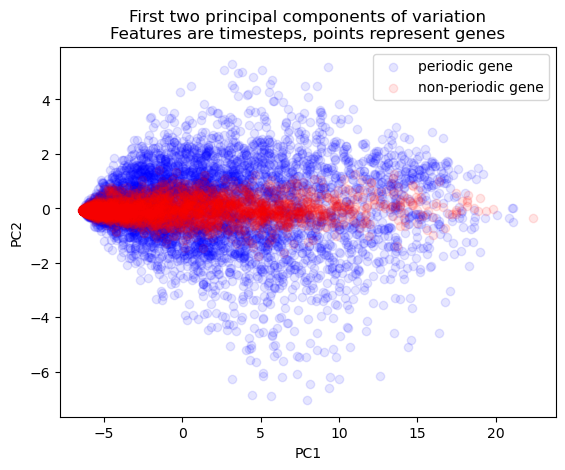

In [55]:
plt.scatter(*Xpca[y, :2].T, c="blue", alpha=0.1, label="periodic gene")
plt.scatter(*Xpca[~y, :2].T, c="red", alpha=0.1, label="non-periodic gene")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("First two principal components of variation\nFeatures are timesteps, points represent genes")
plt.legend()

array([[ 0.1678867 ,  0.16575045,  0.16812792,  0.16924793,  0.16854655,
         0.16907704,  0.16917146,  0.16891494,  0.15047873,  0.16612671,
         0.16607795,  0.16689382,  0.16823478,  0.16663224,  0.16883076,
         0.16879301,  0.16806001,  0.16916197,  0.16931285,  0.16069019,
         0.1621647 ,  0.16737819,  0.16706013,  0.16652495,  0.16740164,
         0.16558465,  0.16803379,  0.16824513,  0.16908786,  0.16906732,
         0.16906206,  0.15415482,  0.16666271,  0.1672749 ,  0.16684673,
         0.1677556 ],
       [ 0.01796742, -0.1925521 , -0.16533745, -0.163098  , -0.16142187,
        -0.15222172, -0.11486648, -0.03699466,  0.31568116,  0.19680348,
         0.17386686,  0.19243522,  0.02033455, -0.18325622, -0.1605666 ,
        -0.1618424 , -0.15415023, -0.13272689, -0.09714979,  0.16703667,
         0.21192164,  0.17684773,  0.1937111 ,  0.18523433,  0.0174051 ,
        -0.18333464, -0.16778905, -0.16466129, -0.15258843, -0.1296741 ,
        -0.07923303,  0.24381

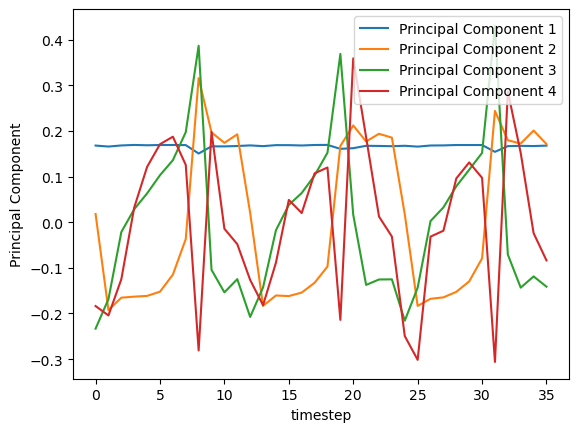

In [61]:
time_variation_components = pipe.named_steps["pca"].components_.copy()
display(time_variation_components)
for i in range(n_components - 1):
    plt.plot(np.arange(time_variation_components.shape[1]), time_variation_components[i], label=f"Principal Component {1 + i}")
plt.xlabel("timestep")
plt.ylabel("Principal Component")
plt.legend()

The first principal component of variation in time seems to be referencing base variation in gene expression levels - the projection of each data point to this component is essentially the same. We can try to remove this variation like they did in the paper by Z-scoring each gene within its own time series data - what will this turn up?

Also worth noting that base arcsinh didn't appear to stabilize all of the variance might want to go back that.

In [63]:
X_timescored = StandardScaler().fit_transform(X) # now we are normalizing in time in addition to gene expressions at each time
X_ts_pca = pipe.fit_transform(X_timescored.T)

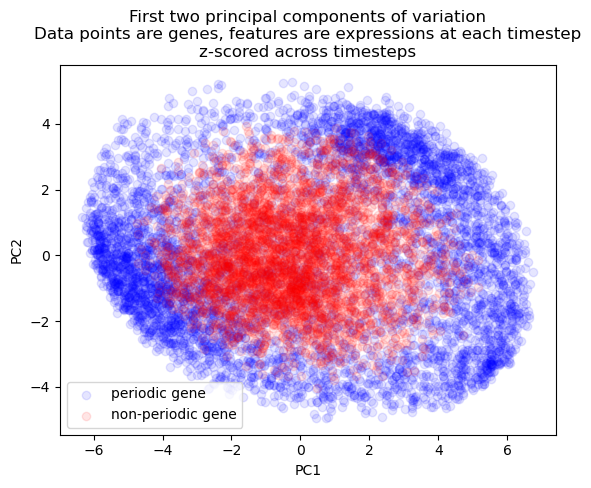

In [71]:
plt.scatter(*X_ts_pca[y, :2].T, c="blue", alpha=0.1, label="periodic gene")
plt.scatter(*X_ts_pca[~y, :2].T, c="red", alpha=0.1, label="non-periodic gene")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("First two principal components of variation\nData points are genes, features are expressions at each timestep\nz-scored across timesteps")
plt.legend()

In [65]:
X_ts_umap = UMAP().fit_transform(X_timescored.T)

In [ ]:
# display(X_timescored.T.shape)

(9275, 36)

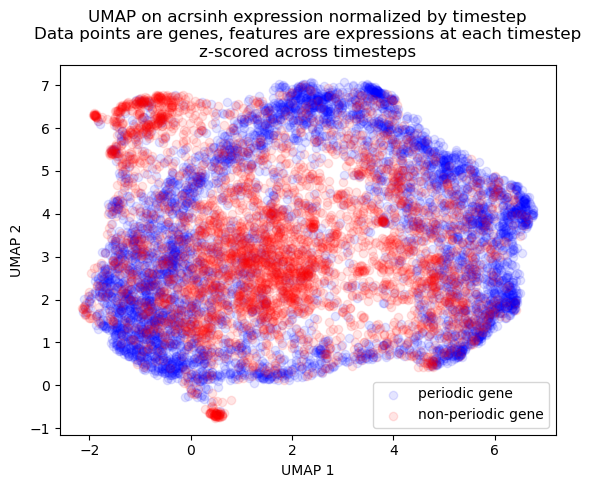

In [70]:
plt.scatter(*X_ts_umap[y, :2].T, c="blue", alpha=0.1, label="periodic gene")
plt.scatter(*X_ts_umap[~y, :2].T, c="red", alpha=0.1, label="non-periodic gene")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.title("UMAP on acrsinh expression normalized by timestep\nData points are genes, features are expressions at each timestep\nz-scored across timesteps")
plt.legend()

There seems to be some interesting ring-like topology among the periodic genes

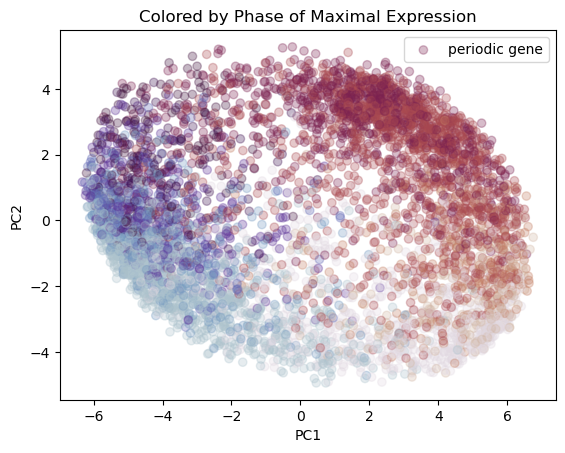

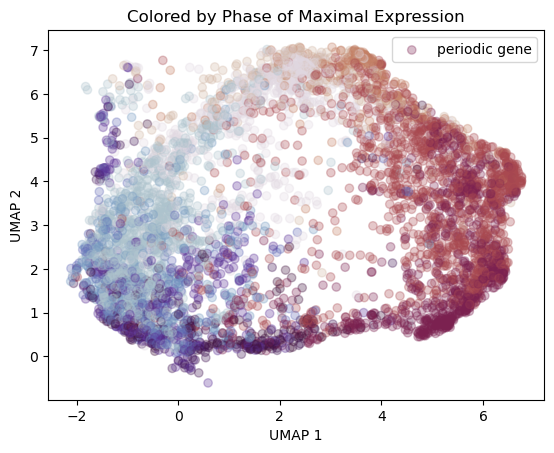

In [84]:
# try coloring with a sequential colormap based on each point's maximal expression
# get the time index with the maximal z-score for each point and scale down to [0, 1]
hues = np.mod(X_timescored.T.argmax(axis=1), 12)/12

plt.scatter(*X_ts_pca[y, :2].T, c=hues[y], cmap="twilight", alpha=0.3, label="periodic gene")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Colored by Phase of Maximal Expression")
plt.legend()
plt.show()

plt.scatter(*X_ts_umap[y, :2].T, c=hues[y], cmap="twilight", alpha=0.3, label="periodic gene")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.title("Colored by Phase of Maximal Expression")
plt.legend()
plt.show()

In [ ]:
# this is interesting - the circular topology seems to correspond to the temporal periodicity... let's do one more set of colormaps

In [86]:
X.shape

(36, 9275)

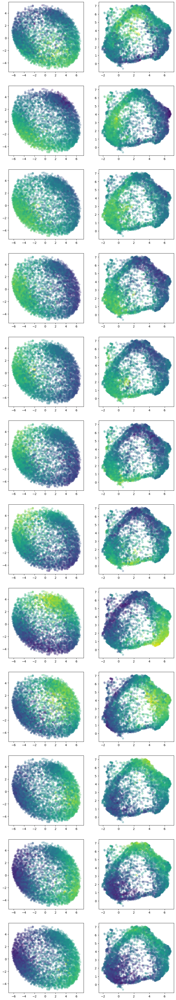

In [91]:
# make one plot for each phase
fig, ax = plt.subplots(12, 2, figsize=(10, 60))
for t in range(12):
    Xphase = np.sum(X_timescored[t::12, :], axis=0)
    ax[t, 0].scatter(*X_ts_pca[y, :2].T, c=Xphase[y], cmap="viridis", alpha=0.3)
    ax[t, 1].scatter(*X_ts_umap[y, :2].T, c=Xphase[y], cmap="viridis", alpha=0.3)
    

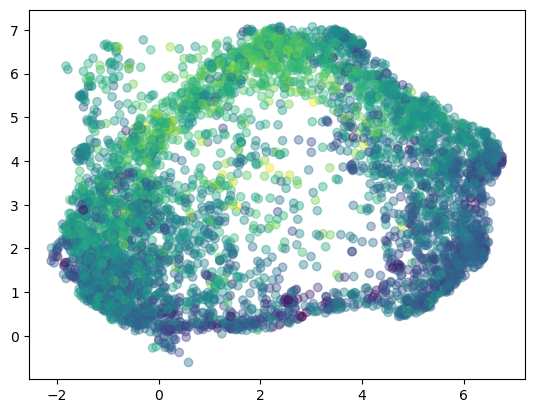

In [95]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)

ts = np.arange(36)

scatter = ax.scatter(*X_ts_umap[y, :2].T, c=X_timescored[t, y], cmap="viridis", alpha=0.4)

def update(t):
    scatter.set_array(X_timescored[t, y])

from matplotlib import animation
animation.writer = animation.writers["ffmpeg"]

ani = animation.FuncAnimation(fig, update, frames=ts, interval=1000 * 3 / 36)
ani.save("expression_cycle_umap.mp4")


# for t in range(36):
#     Xtscores = X_timescored[t, :]
#     Xphase = np.sum(X_timescored[t::12, :], axis=0)
#     ax[t, 0].scatter(*X_ts_pca[y, :2].T, c=Xphase[y], cmap="viridis", alpha=0.3)
#     ax[t, 1].scatter(*X_ts_umap[y, :2].T, c=Xphase[y], cmap="viridis", alpha=0.3)

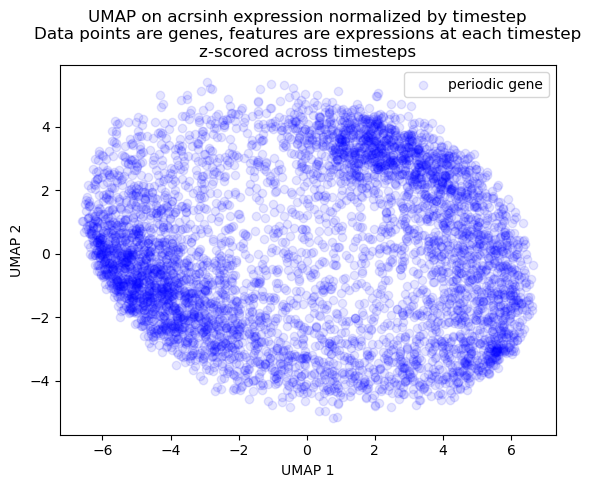

In [100]:
# one more PCA + UMAP but without the non-periodic points to see if it clears up a bit

X_ts_pca_periodic = pipe.fit_transform(X_timescored[:, y].T)


plt.scatter(*X_ts_pca_periodic[:, :2].T, c="blue", alpha=0.1, label="periodic gene")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.title("UMAP on acrsinh expression normalized by timestep\nData points are genes, features are expressions at each timestep\nz-scored across timesteps")
plt.legend()

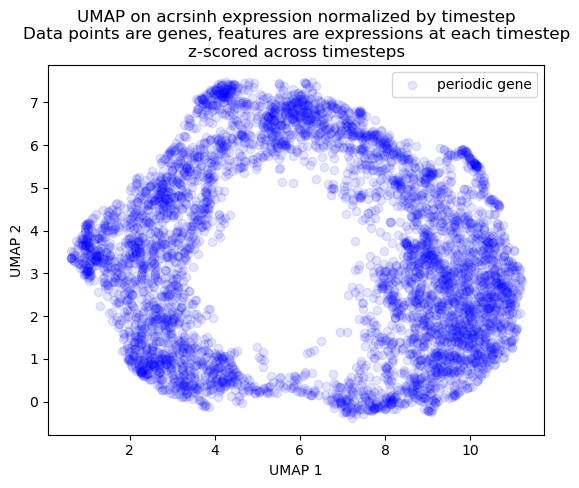

In [ ]:
# one more PCA + UMAP but without the non-periodic points to see if it clears up a bit

X_ts_umap_periodic = UMAP().fit_transform(X_timescored[:, y].T)


plt.scatter(*X_ts_umap_periodic[:, :2].T, c="blue", alpha=0.1, label="periodic gene")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.title("UMAP on acrsinh expression normalized by timestep\nData points are genes, features are expressions at each timestep\nz-scored across timesteps")
plt.legend()

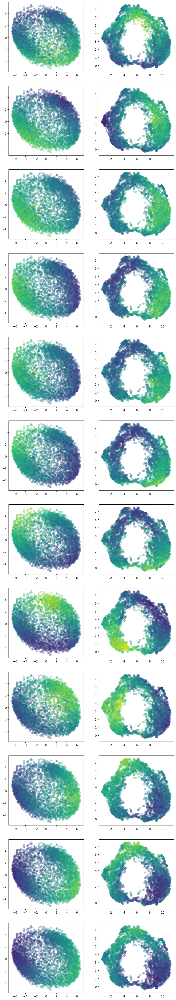

In [101]:
# make one plot for each phase
fig, ax = plt.subplots(12, 2, figsize=(10, 60))
for t in range(12):
    Xphase = np.sum(X_timescored[t::12, :], axis=0)
    ax[t, 0].scatter(*X_ts_pca_periodic[:, :2].T, c=Xphase[y], cmap="viridis", alpha=0.3)
    ax[t, 1].scatter(*X_ts_umap_periodic[:, :2].T, c=Xphase[y], cmap="viridis", alpha=0.3)
    

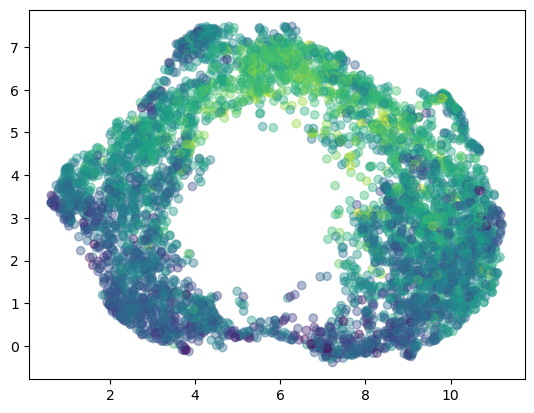

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)

ts = np.arange(36)

scatter = ax.scatter(*X_ts_umap_periodic[:, :2].T, c=X_timescored[t, y], cmap="viridis", alpha=0.4)

def update(t):
    scatter.set_array(X_timescored[t, y])

from matplotlib import animation
animation.writer = animation.writers["ffmpeg"]

ani = animation.FuncAnimation(fig, update, frames=ts, interval=1000 * 3 / 36)
ani.save("expression_cycle_periodic_umap.mp4")


# for t in range(36):
#     Xtscores = X_timescored[t, :]
#     Xphase = np.sum(X_timescored[t::12, :], axis=0)
#     ax[t, 0].scatter(*X_ts_pca[y, :2].T, c=Xphase[y], cmap="viridis", alpha=0.3)
#     ax[t, 1].scatter(*X_ts_umap[y, :2].T, c=Xphase[y], cmap="viridis", alpha=0.3)